# Calculating Number of Parameters + Operaion Cost

In [35]:
import torch
from torchvision.models import resnet50
from thop import profile

model = resnet50()

input_ = torch.randn(1, 3, 224, 224)

macs, params = profile(model, inputs=(input_, ))

[INFO] Register count_convNd() for <class 'torch.nn.modules.conv.Conv2d'>.
[INFO] Register count_bn() for <class 'torch.nn.modules.batchnorm.BatchNorm2d'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.activation.ReLU'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.pooling.MaxPool2d'>.
[WARN] Cannot find rule for <class 'torch.nn.modules.container.Sequential'>. Treat it as zero Macs and zero Params.
[WARN] Cannot find rule for <class 'torchvision.models.resnet.Bottleneck'>. Treat it as zero Macs and zero Params.
[INFO] Register count_adap_avgpool() for <class 'torch.nn.modules.pooling.AdaptiveAvgPool2d'>.
[INFO] Register count_linear() for <class 'torch.nn.modules.linear.Linear'>.
[WARN] Cannot find rule for <class 'torchvision.models.resnet.ResNet'>. Treat it as zero Macs and zero Params.


In [36]:
from thop import clever_format
macs, params = clever_format([macs, params], "%.3f")

FLOPs = macs

In [37]:
macs

'4.112G'

In [38]:
params

'25.557M'

In [ ]:
####Define the rule for 3rd party module.

class YourModule(nn.Module):
    # your definition
def count_your_model(model, x, y):
    # your rule here

input = torch.randn(1, 3, 224, 224)
macs, params = profile(model, inputs=(input, ), 
                        custom_ops={YourModule: count_your_model})

In [23]:
import torchvision.models as models
import torch
from ptflops import get_model_complexity_info

In [26]:
with torch.cuda.device(0):
  net = models.resnet50()
  macs, params = get_model_complexity_info(net, 
                                           (3, 224, 224),
                                           as_strings=True,
                                           print_per_layer_stat=False, 
                                           verbose=False)
    
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

Computational complexity:       4.12 GMac
Number of parameters:           25.56 M 


In [43]:
#Number of Bytes per image
print(torch.rand(2).type(torch.DoubleTensor).element_size())
print(torch.rand(2).type(torch.float32).element_size())
print(torch.rand(2).type(torch.double).element_size())
print(torch.rand(2).type(torch.int8).element_size())

8
4
8
1


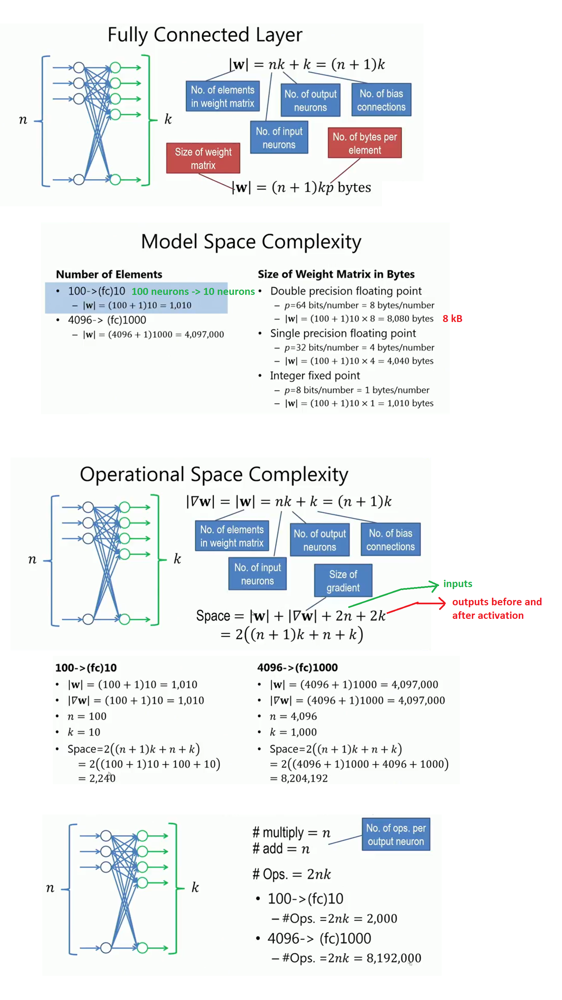

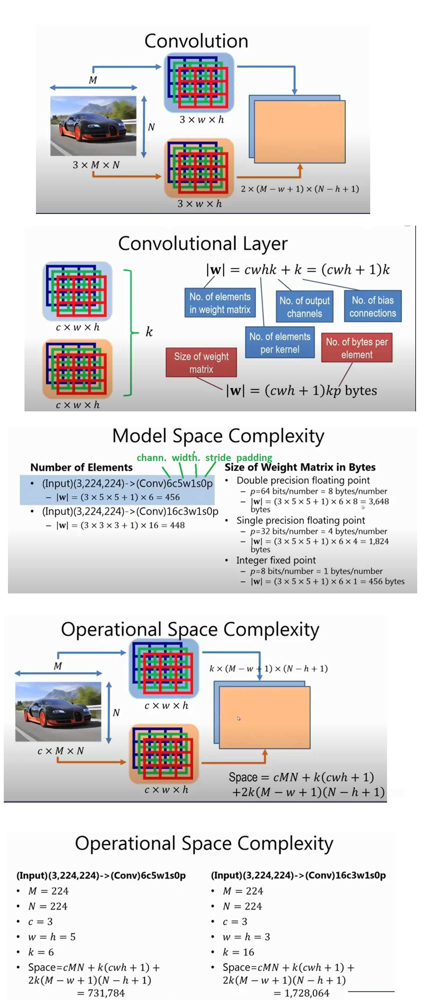

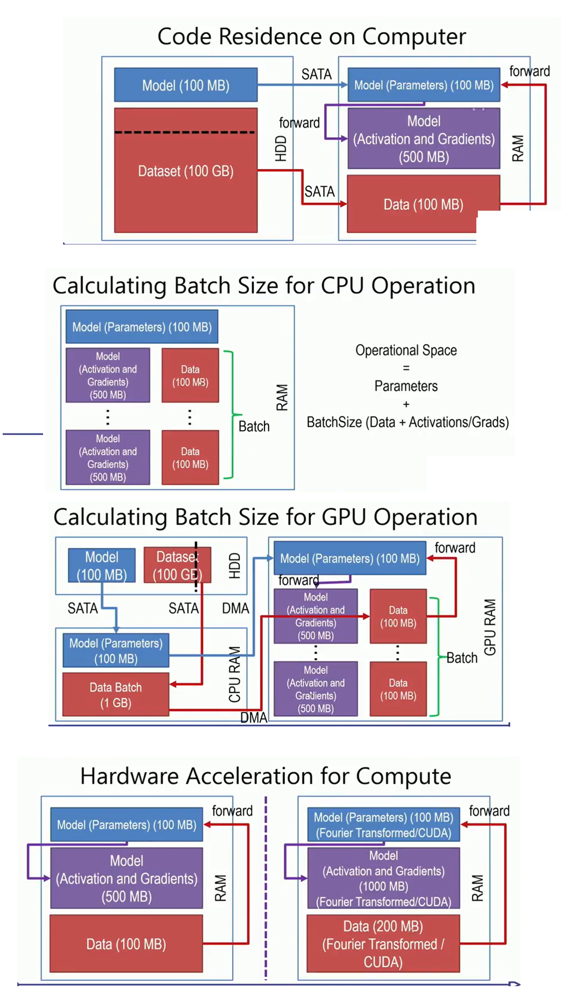

In [39]:
# Define a model
import torch
import torch.nn as nn
from torch.autograd import Variable
import numpy as np
class Model(nn.Module):

    def __init__(self):
        super(Model,self).__init__()

        self.conv0 = nn.Conv2d(1, 16, kernel_size=3, padding=5)
        self.conv1 = nn.Conv2d(16, 32, kernel_size=3)

    def forward(self, x):
        h = self.conv0(x)
        h = self.conv1(h)
        return h

In [40]:
model = Model()

In [45]:
import torch
import torch.nn as nn
from torch.autograd import Variable
import numpy as np

class SizeEstimator(object):

    def __init__(self, model, input_size=(1,1,32,32), bits=32):
        '''
        Estimates the size of PyTorch models in memory
        for a given input size
        '''
        self.model = model
        self.input_size = input_size
        self.bits = bits
        return

    def get_parameter_sizes(self):
        '''Get sizes of all parameters in `model`'''
        mods = list(self.model.modules())
        sizes = []
        
        for i in range(1,len(mods)):
            m = mods[i]
            p = list(m.parameters())
            for j in range(len(p)):
                sizes.append(np.array(p[j].size()))

        self.param_sizes = sizes
        return

    def get_output_sizes(self):
        '''Run sample input through each layer to get output sizes'''
        input_ = Variable(torch.FloatTensor(*self.input_size), volatile=True)
        mods = list(self.model.modules())
        out_sizes = []
        for i in range(1, len(mods)):
            m = mods[i]
            out = m(input_)
            out_sizes.append(np.array(out.size()))
            input_ = out

        self.out_sizes = out_sizes
        return

    def calc_param_bits(self):
        '''Calculate total number of bits to store `model` parameters'''
        total_bits = 0
        for i in range(len(self.param_sizes)):
            s = self.param_sizes[i]
            bits = np.prod(np.array(s))*self.bits
            total_bits += bits
        self.param_bits = total_bits
        return

    def calc_forward_backward_bits(self):
        '''Calculate bits to store forward and backward pass'''
        total_bits = 0
        for i in range(len(self.out_sizes)):
            s = self.out_sizes[i]
            bits = np.prod(np.array(s))*self.bits
            total_bits += bits
        # multiply by 2 for both forward AND backward
        self.forward_backward_bits = (total_bits*2)
        return

    def calc_input_bits(self):
        '''Calculate bits to store input'''
        self.input_bits = np.prod(np.array(self.input_size))*self.bits
        return

    def estimate_size(self):
        '''Estimate model size in memory in megabytes and bits'''
        self.get_parameter_sizes()
        self.get_output_sizes()
        self.calc_param_bits()
        self.calc_forward_backward_bits()
        self.calc_input_bits()
        total = self.param_bits + self.forward_backward_bits + self.input_bits

        total_megabytes = (total/8)/(1024**2)
        return total_megabytes, total

In [47]:
se = SizeEstimator(model, input_size=(16,1,256,256))
print(se.estimate_size())

C:\Users\Ashwin\Miniconda3\lib\site-packages\ipykernel_launcher.py:34: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.


(-103.716064453125, -870033408)


C:\Users\Ashwin\Miniconda3\lib\site-packages\ipykernel_launcher.py:64: RuntimeWarning: overflow encountered in long_scalars


In [49]:
se = SizeEstimator(model, input_size=(16,1,256,256))
print(se.estimate_size())

# Returns
# (size in megabytes, size in bits)
# (408.2833251953125, 3424928768)

print(se.param_bits) # bits taken up by parameters
print(se.forward_backward_bits) # bits stored for forward and backward
print(se.input_bits) # bits for input

C:\Users\Ashwin\Miniconda3\lib\site-packages\ipykernel_launcher.py:34: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.


(-103.716064453125, -870033408)
153600
-903741440
33554432


C:\Users\Ashwin\Miniconda3\lib\site-packages\ipykernel_launcher.py:64: RuntimeWarning: overflow encountered in long_scalars


#  LeNet

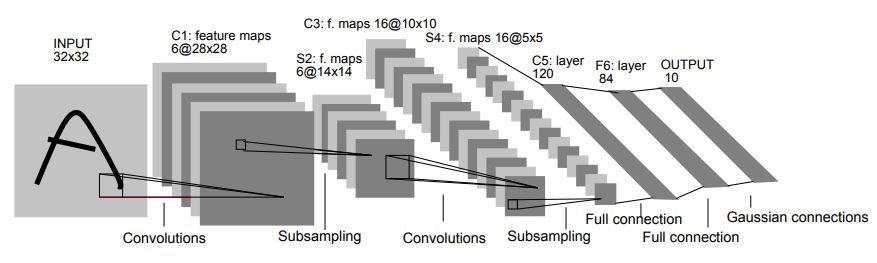

## Import 

In [1]:
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F

print(torch.__version__) # This code has been updated for PyTorch 1.0.0

1.5.0


## Define network architecture

<b> torch.nn.Conv2d(in_channels, out_channels , kernel_size , stride , padding ) </b>

In [11]:
class LeNet(nn.Module):
    def __init__(self):
        super(LeNet, self).__init__()
        self.conv1 = nn.Conv2d(1, 6, kernel_size=5)  # 5x5Kernel
        self.pool1 = nn.MaxPool2d(kernel_size=2,stride=2) #Max Pooling (2x2) max pooling , stride = 2
        self.conv2 = nn.Conv2d(6, 16, kernel_size=5)
        self.pool2 = nn.MaxPool2d(kernel_size=2,stride=2)        
        self.fc1 = nn.Linear(400, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        print('Size of output of conv1: '+str(x.size()))
        x = self.pool1(x)
        print('Size of output of pool1: '+str(x.size()))
        x = F.relu(self.conv2(x))
        print('Size of output of conv2: '+str(x.size()))
        x = self.pool2(x)
        print('Size of output of pool2: '+str(x.size()))
        x = x.view(-1, 16*5*5) ##Flatten the Volume of Neurons into a single stack of neurons
        print('Size of flattened response: '+str(x.size()))
        x = F.relu(self.fc1(x)) 
        print('Size of output of fc1: '+str(x.size()))
        x = F.relu(self.fc2(x))
        print('Size of output of fc2: '+str(x.size()))
        x = self.fc3(x)
        print('Size of output of fc3: '+str(x.size()))
        return x

In [12]:
net = LeNet()
print(net)

LeNet(
  (conv1): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1))
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=400, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=10, bias=True)
)


## Data feed-forward

In [5]:
inputData = torch.Tensor(1,1,32,32) # (batch_number(sample_number) , channel , width , height)
# Random input tensor

outData = net(inputData)

Size of output of conv1: torch.Size([1, 6, 28, 28])
Size of output of pool1: torch.Size([1, 6, 14, 14])
Size of output of conv2: torch.Size([1, 16, 10, 10])
Size of output of pool2: torch.Size([1, 16, 5, 5])
Size of flattened response: torch.Size([1, 400])
Size of output of fc1: torch.Size([1, 120])
Size of output of fc2: torch.Size([1, 84])
Size of output of fc3: torch.Size([1, 10])


tensor([[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]],
       grad_fn=<AddmmBackward>)

## Trainable parameters

In [6]:
totalParams = 0
for name,params in net.named_parameters():
    print(name,'--> parameter size:',params.size())
    totalParams += np.sum(np.prod(params.size()))
print('---------------------------------------------')
print('Total number of parameters: '+str(totalParams))

conv1.weight --> parameter size: torch.Size([6, 1, 5, 5])
conv1.bias --> parameter size: torch.Size([6])
conv2.weight --> parameter size: torch.Size([16, 6, 5, 5])
conv2.bias --> parameter size: torch.Size([16])
fc1.weight --> parameter size: torch.Size([120, 400])
fc1.bias --> parameter size: torch.Size([120])
fc2.weight --> parameter size: torch.Size([84, 120])
fc2.bias --> parameter size: torch.Size([84])
fc3.weight --> parameter size: torch.Size([10, 84])
fc3.bias --> parameter size: torch.Size([10])
---------------------------------------------
Total number of parameters: 61706


## Training a LeNet for MNIST Classification

### Import

In [25]:
%matplotlib inline
import copy
import time
import torch
import numpy as np
import torchvision
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchvision import transforms,datasets

print(torch.__version__) # This code has been updated for PyTorch 1.0.0

1.5.0


### Load data:

In [43]:
apply_transform = transforms.Compose([transforms.Resize(32),transforms.ToTensor()])
BatchSize = 100

trainset = datasets.MNIST(root='./MNIST', train=True, download=True, transform=apply_transform)
trainLoader = torch.utils.data.DataLoader(trainset, batch_size=BatchSize,
                                          shuffle=True, num_workers=4) # Creating dataloader

testset = datasets.MNIST(root='./MNIST', train=False, download=True, transform=apply_transform)
testLoader = torch.utils.data.DataLoader(testset, batch_size=BatchSize,
                                         shuffle=False, num_workers=4) # Creating dataloader

In [44]:
# Size of train and test datasets
print('No. of samples in train set: '+str(len(trainLoader.dataset)))
print('No. of samples in test set: '+str(len(testLoader.dataset)))

No. of samples in train set: 60000
No. of samples in test set: 10000


### Define network architecture

In [45]:
class LeNet(nn.Module):
    def __init__(self):
        super(LeNet, self).__init__()
        self.conv1 = nn.Conv2d(1, 6, kernel_size=5)
        self.pool1 = nn.MaxPool2d(kernel_size=2,stride=2)
        self.conv2 = nn.Conv2d(6, 16, kernel_size=5)
        self.pool2 = nn.MaxPool2d(kernel_size=2,stride=2)        
        self.fc1 = nn.Linear(400, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)
        x = F.relu(self.conv2(x))
        x = self.pool2(x)
        x = x.view(-1, 400)
        x = F.relu(self.fc1(x)) 
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return F.log_softmax(x,dim=1)  ##Since Negative Log Likelihood Loss is Used

In [46]:
net = LeNet()
print(net)

LeNet(
  (conv1): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1))
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=400, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=10, bias=True)
)


In [47]:
# Copying initial weights for visualization
init_weightConv1 = copy.deepcopy(net.conv1.weight.data)
init_weightConv2 = copy.deepcopy(net.conv2.weight.data)

In [48]:
# Check availability of GPU
use_gpu = torch.cuda.is_available()
if use_gpu:
    print('GPU is available!')
    device = "cuda"
else:
    print('GPU is not available!')
    device = "cpu"

net = net.to(device)

GPU is available!


### Define loss function and optimizer

In [49]:
criterion = nn.NLLLoss() # Negative Log-likelihood
optimizer = optim.Adam(net.parameters(), lr=1e-4) # Adam

### Train the network

Iteration: 1 /10  ;  Training Loss: 0.312740 ; Testing Acc: 92.850 ; Time consumed: 0m 28s 
Iteration: 2 /10  ;  Training Loss: 0.225719 ; Testing Acc: 94.700 ; Time consumed: 0m 26s 
Iteration: 3 /10  ;  Training Loss: 0.172541 ; Testing Acc: 95.610 ; Time consumed: 0m 31s 
Iteration: 4 /10  ;  Training Loss: 0.140425 ; Testing Acc: 96.580 ; Time consumed: 0m 22s 
Iteration: 5 /10  ;  Training Loss: 0.119658 ; Testing Acc: 97.100 ; Time consumed: 0m 22s 
Iteration: 6 /10  ;  Training Loss: 0.106572 ; Testing Acc: 97.250 ; Time consumed: 0m 24s 
Iteration: 7 /10  ;  Training Loss: 0.096145 ; Testing Acc: 97.570 ; Time consumed: 0m 25s 
Iteration: 8 /10  ;  Training Loss: 0.088738 ; Testing Acc: 97.580 ; Time consumed: 0m 24s 
Iteration: 9 /10  ;  Training Loss: 0.081928 ; Testing Acc: 97.810 ; Time consumed: 0m 22s 
Iteration: 10 /10  ;  Training Loss: 0.076319 ; Testing Acc: 97.900 ; Time consumed: 0m 22s 
Training completed in 4m 7s


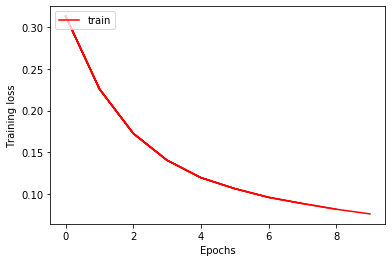

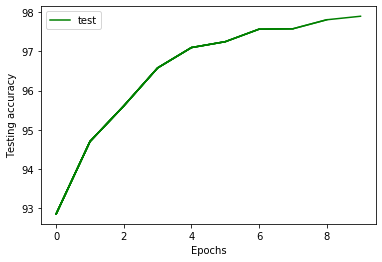

In [51]:
iterations = 10
trainLoss = []
testAcc = []
start = time.time()
for epoch in range(iterations):
    epochStart = time.time()
    runningLoss = 0    
    net.train() # For training-mode
    for i,data in enumerate(trainLoader): # i -> batch number
        inputs,labels = data
        inputs, labels = inputs.to(device), labels.to(device)         
        # Initialize gradients to zero
        optimizer.zero_grad()
        # Feed-forward input data through the network        
        outputs = net(inputs)        
        # Compute loss/error
        loss = criterion(outputs, labels) # loss is averaged in each batch
        # Backpropagate loss and compute gradients
        loss.backward()
        # Update the network parameters
        optimizer.step()
        # Accumulate loss per batch
        runningLoss += loss.item()  
    avgTrainLoss = runningLoss/(i+1) 
    trainLoss.append(avgTrainLoss)
    
    # Evaluating performance on test set for each epoch
    net.eval() # For testing [Affects batch-norm and dropout layers (if any)]
    running_correct = 0
    with torch.no_grad():
        for data in testLoader:
            inputs,labels = data
            inputs = inputs.to(device)
            outputs = net(inputs)
            _, predicted = torch.max(outputs.data, 1)
            if use_gpu:                
                predicted = predicted.cpu()            
            running_correct += (predicted == labels).sum()
    avgTestAcc = float(running_correct)*100/10000.0
    testAcc.append(avgTestAcc)
        
    # Plotting training loss vs Epochs
    fig1 = plt.figure(1)        
    plt.plot(range(epoch+1),trainLoss,'r-',label='train')        
    if epoch==0:
        plt.legend(loc='upper left')
        plt.xlabel('Epochs')
        plt.ylabel('Training loss')   
    # Plotting testing accuracy vs Epochs
    fig2 = plt.figure(2)        
    plt.plot(range(epoch+1),testAcc,'g-',label='test')        
    if epoch==0:
        plt.legend(loc='upper left')
        plt.xlabel('Epochs')
        plt.ylabel('Testing accuracy')    
    epochEnd = time.time()-epochStart
    print('Iteration: {:.0f} /{:.0f}  ;  Training Loss: {:.6f} ; Testing Acc: {:.3f} ; Time consumed: {:.0f}m {:.0f}s '\
          .format(epoch + 1,iterations,avgTrainLoss,avgTestAcc,epochEnd//60,epochEnd%60))
end = time.time()-start
print('Training completed in {:.0f}m {:.0f}s'.format(end//60,end%60))

In [56]:
# Copying trained weights for visualization
trained_weightConv1 = copy.deepcopy(net.conv1.weight.data)
trained_weightConv2 = copy.deepcopy(net.conv2.weight.data)

### Visualization of weights

In [57]:
# functions to show an image
def imshow(img, strlabel):
    npimg = img.numpy()
    npimg = np.abs(npimg)
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 10
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size
    plt.figure()
    plt.title(strlabel)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

In [58]:
if use_gpu:
    trained_weightConv1 = trained_weightConv1.cpu()
    trained_weightConv2 = trained_weightConv2.cpu()

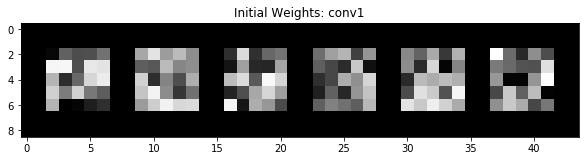

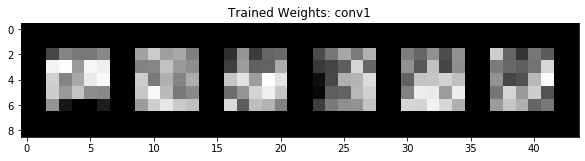

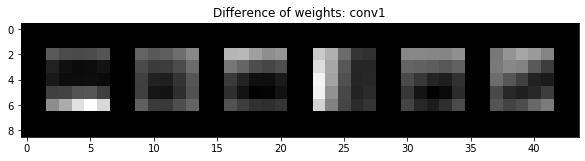

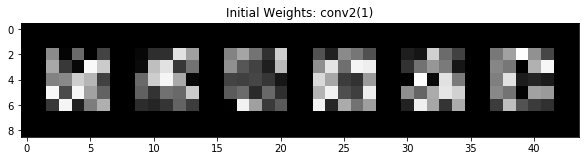

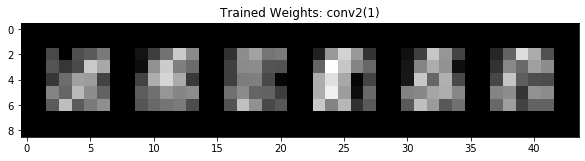

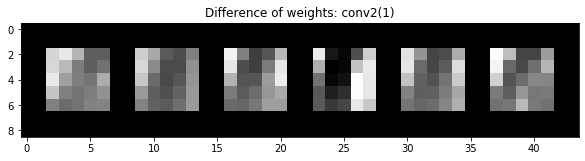

In [60]:
imshow(torchvision.utils.make_grid(init_weightConv1,nrow=6,normalize=True),'Initial Weights: conv1')
imshow(torchvision.utils.make_grid(trained_weightConv1,nrow=6,normalize=True),'Trained Weights: conv1')
imshow(torchvision.utils.make_grid(init_weightConv1-trained_weightConv1,nrow=6,normalize=True),'Difference of weights: conv1')

imshow(torchvision.utils.make_grid(init_weightConv2[0].unsqueeze(1),nrow=6,normalize=True),'Initial Weights: conv2(1)')
#Picking only the first kernel [0]
imshow(torchvision.utils.make_grid(trained_weightConv2[0].unsqueeze(1),nrow=6,normalize=True),'Trained Weights: conv2(1)')
imshow(torchvision.utils.make_grid(init_weightConv2[0].unsqueeze(1)-trained_weightConv2[0].unsqueeze(1),nrow=6,normalize=True),'Difference of weights: conv2(1)')

## Modifying a LeNet for CIFAR (3-Channel)

### Imports

In [70]:
%matplotlib inline
import copy
import time
import torch
import torchvision
import numpy as np
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchvision import transforms,datasets

print(torch.__version__) # This code has been updated for PyTorch 1.0.0

1.5.0


### Load data:

In [72]:
apply_transform = transforms.Compose([transforms.Resize(32),transforms.ToTensor()])
BatchSize = 100

trainset = datasets.CIFAR10(root='./CIFAR10', train=True, download=True, transform=apply_transform)
trainLoader = torch.utils.data.DataLoader(trainset, batch_size=BatchSize,
                                          shuffle=True, num_workers=4) # Creating dataloader

testset = datasets.CIFAR10(root='./CIFAR10', train=False, download=True, transform=apply_transform)
testLoader = torch.utils.data.DataLoader(testset, batch_size=BatchSize,
                                         shuffle=False, num_workers=4) # Creating dataloader



0it [00:00, ?it/s]



  0%|          | 0/170498071 [00:00<?, ?it/s]

  0%|          | 40960/170498071 [00:00<08:03, 352873.73it/s]

  0%|          | 106496/170498071 [00:00<07:03, 401937.79it/s]

  0%|          | 221184/170498071 [00:00<05:42, 497448.30it/s]

  0%|          | 368640/170498071 [00:00<04:35, 617677.97it/s]

  0%|          | 516096/170498071 [00:00<03:47, 746380.43it/s]

  0%|          | 663552/170498071 [00:01<03:14, 871514.77it/s]

  0%|          | 811008/170498071 [00:01<02:52, 985976.58it/s]

  1%|          | 958464/170498071 [00:01<02:35, 1093016.39it/s]

  1%|          | 1105920/170498071 [00:01<02:23, 1182906.53it/s]

  1%|          | 1253376/170498071 [00:01<02:14, 1255735.31it/s]

  1%|          | 1417216/170498071 [00:01<02:07, 1321617.24it/s]

  1%|          | 1564672/170498071 [00:01<02:04, 1359866.53it/s]

  1%|          | 1720320/170498071 [00:01<01:59, 1409781.86it/s]

  1%|          | 1875968/170498071 [00:01<01:59, 1408895.77it/s]

  1%|          | 2039808/170498071 [00:02<0

 21%|██▏       | 36298752/170498071 [00:24<01:29, 1503661.38it/s]

 21%|██▏       | 36462592/170498071 [00:24<01:28, 1510005.49it/s]

 21%|██▏       | 36626432/170498071 [00:24<01:28, 1506999.62it/s]

 22%|██▏       | 36790272/170498071 [00:25<01:28, 1514156.92it/s]

 22%|██▏       | 36954112/170498071 [00:25<01:28, 1514439.69it/s]

 22%|██▏       | 37117952/170498071 [00:25<01:27, 1520172.20it/s]

 22%|██▏       | 37281792/170498071 [00:25<01:27, 1528691.61it/s]

 22%|██▏       | 37445632/170498071 [00:25<01:26, 1532871.84it/s]

 22%|██▏       | 37609472/170498071 [00:25<01:27, 1525285.41it/s]

 22%|██▏       | 37773312/170498071 [00:25<01:26, 1528278.50it/s]

 22%|██▏       | 37937152/170498071 [00:25<01:27, 1521951.27it/s]

 22%|██▏       | 38100992/170498071 [00:25<01:27, 1512226.46it/s]

 22%|██▏       | 38256640/170498071 [00:25<01:26, 1523722.07it/s]

 23%|██▎       | 38412288/170498071 [00:26<01:29, 1479491.00it/s]

 23%|██▎       | 38567936/170498071 [00:26<01:28, 1497978.25it

 45%|████▍     | 76062720/170498071 [00:48<00:56, 1672559.57it/s]

 45%|████▍     | 76242944/170498071 [00:48<00:55, 1686317.13it/s]

 45%|████▍     | 76414976/170498071 [00:48<00:55, 1690700.42it/s]

 45%|████▍     | 76587008/170498071 [00:49<00:55, 1683633.12it/s]

 45%|████▌     | 76767232/170498071 [00:49<00:55, 1693589.21it/s]

 45%|████▌     | 76947456/170498071 [00:49<00:55, 1700623.08it/s]

 45%|████▌     | 77127680/170498071 [00:49<00:54, 1705630.15it/s]

 45%|████▌     | 77324288/170498071 [00:49<00:53, 1752741.53it/s]

 45%|████▌     | 77504512/170498071 [00:49<00:53, 1741938.35it/s]

 46%|████▌     | 77701120/170498071 [00:49<00:52, 1778622.21it/s]

 46%|████▌     | 77897728/170498071 [00:49<00:51, 1782332.58it/s]

 46%|████▌     | 78094336/170498071 [00:49<00:51, 1784111.87it/s]

 46%|████▌     | 78290944/170498071 [00:49<00:50, 1822071.40it/s]

 46%|████▌     | 78487552/170498071 [00:50<00:49, 1848725.52it/s]

 46%|████▌     | 78700544/170498071 [00:50<00:48, 1874493.57it

 74%|███████▎  | 125509632/170498071 [01:12<00:20, 2147960.61it/s]

 74%|███████▎  | 125739008/170498071 [01:12<00:20, 2159135.92it/s]

 74%|███████▍  | 125960192/170498071 [01:12<00:20, 2174509.33it/s]

 74%|███████▍  | 126181376/170498071 [01:12<00:20, 2153180.35it/s]

 74%|███████▍  | 126410752/170498071 [01:12<00:20, 2164130.04it/s]

 74%|███████▍  | 126640128/170498071 [01:12<00:20, 2140104.10it/s]

 74%|███████▍  | 126869504/170498071 [01:12<00:20, 2153272.19it/s]

 75%|███████▍  | 127090688/170498071 [01:12<00:20, 2170028.99it/s]

 75%|███████▍  | 127311872/170498071 [01:12<00:20, 2126097.96it/s]

 75%|███████▍  | 127541248/170498071 [01:13<00:20, 2132183.83it/s]

 75%|███████▍  | 127770624/170498071 [01:13<00:19, 2150513.63it/s]

 75%|███████▌  | 128000000/170498071 [01:13<00:19, 2159696.78it/s]

 75%|███████▌  | 128229376/170498071 [01:13<00:19, 2137101.60it/s]

 75%|███████▌  | 128475136/170498071 [01:13<00:19, 2193730.27it/s]

 75%|███████▌  | 128704512/170498071 [01:13<00:1

Extracting ./CIFAR10\cifar-10-python.tar.gz to ./CIFAR10
Files already downloaded and verified


In [ ]:
# Size of train and test datasets
print('No. of samples in train set: '+str(len(trainLoader.dataset)))
print('No. of samples in test set: '+str(len(testLoader.dataset)))

### Define network architecture

In [ ]:
class LeNet(nn.Module):
    def __init__(self):
        super(LeNet, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)  ## 3 input channels , 6 output channels , 5x5 kernel
        self.pool = nn.MaxPool2d(2, 2)  #2x2 max pooling , stride = 2
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 16 * 5 * 5)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return F.log_softmax(x,dim=1)  #since NNL loss is used

In [ ]:
net = LeNet()
print(net)

In [ ]:
# Copying initial weights for visualization
init_weightConv1 = copy.deepcopy(net.conv1.weight.data)
init_weightConv2 = copy.deepcopy(net.conv2.weight.data)

In [ ]:
# Check availability of GPU
use_gpu = torch.cuda.is_available()
if use_gpu:
    print('GPU is available!')
    device = "cuda"
else:
    print('GPU is not available!')
    device = "cpu"

net = net.to(device)

### Define loss function and optimizer

In [ ]:
criterion = nn.NLLLoss() # Negative Log-likelihood
optimizer = optim.Adam(net.parameters(), lr=1e-4) # Adam

### Train the network

Iteration: 1 /10  ;  Training Loss: 2.088211 ; Testing Acc: 30.660 %; Time consumed: 0m 38s 
Iteration: 2 /10  ;  Training Loss: 1.846434 ; Testing Acc: 35.450 %; Time consumed: 0m 38s 
Iteration: 3 /10  ;  Training Loss: 1.731239 ; Testing Acc: 38.980 %; Time consumed: 0m 38s 
Iteration: 4 /10  ;  Training Loss: 1.651608 ; Testing Acc: 40.310 %; Time consumed: 0m 39s 
Iteration: 5 /10  ;  Training Loss: 1.603711 ; Testing Acc: 41.300 %; Time consumed: 0m 38s 
Iteration: 6 /10  ;  Training Loss: 1.568475 ; Testing Acc: 43.320 %; Time consumed: 0m 40s 
Iteration: 7 /10  ;  Training Loss: 1.537546 ; Testing Acc: 44.090 %; Time consumed: 0m 37s 
Iteration: 8 /10  ;  Training Loss: 1.513130 ; Testing Acc: 45.060 %; Time consumed: 0m 38s 
Iteration: 9 /10  ;  Training Loss: 1.491693 ; Testing Acc: 45.410 %; Time consumed: 0m 36s 
Iteration: 10 /10  ;  Training Loss: 1.473837 ; Testing Acc: 46.890 %; Time consumed: 0m 38s 
Training completed in 6m 22s


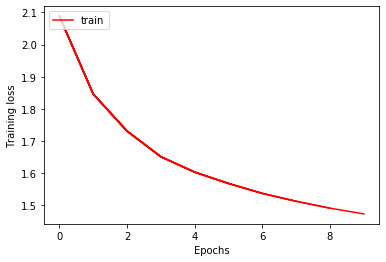

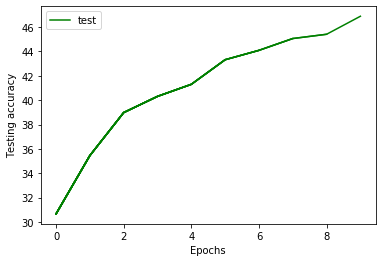

In [77]:
iterations = 2
trainLoss = []
testAcc = []
start = time.time()
for epoch in range(iterations):
    epochStart = time.time()
    runningLoss = 0    
    net.train() # For training
    for i,data in enumerate(trainLoader):
        inputs,labels = data
        # Wrap them in Variable
        inputs, labels = inputs.to(device), labels.to(device)         
        # Initialize gradients to zero
        optimizer.zero_grad()
        # Feed-forward input data through the network        
        outputs = net(inputs)        
        # Compute loss/error
        loss = criterion(outputs, labels) # loss is averaged in each batch
        # Backpropagate loss and compute gradients
        loss.backward()
        # Update the network parameters
        optimizer.step()
        # Accumulate loss per batch
        runningLoss += loss.item()   
    avgTrainLoss = runningLoss/(i+1) 
    trainLoss.append(avgTrainLoss)
    
    # Evaluating performance on test set for each epoch
    net.eval() # For testing [Affects batch-norm and dropout layers (if any)]
    running_correct = 0
    with torch.no_grad():
        for data in testLoader:
            inputs,labels = data
            inputs = inputs.to(device)
            outputs = net(inputs)
            _, predicted = torch.max(outputs.data, 1)
            if use_gpu:                
                predicted = predicted.cpu()            
            running_correct += (predicted == labels).sum()
    avgTestAcc = float(running_correct)*100/10000.0
    testAcc.append(avgTestAcc)
        
    # Plotting training loss vs Epochs
    fig1 = plt.figure(1)        
    plt.plot(range(epoch+1),trainLoss,'r-',label='train')        
    if epoch==0:
        plt.legend(loc='upper left')
        plt.xlabel('Epochs')
        plt.ylabel('Training loss')   
    # Plotting testing accuracy vs Epochs
    fig2 = plt.figure(2)        
    plt.plot(range(epoch+1),testAcc,'g-',label='test')        
    if epoch==0:
        plt.legend(loc='upper left')
        plt.xlabel('Epochs')
        plt.ylabel('Testing accuracy')    
    epochEnd = time.time()-epochStart
    print('Iteration: {:.0f} /{:.0f}  ;  Training Loss: {:.6f} ; Testing Acc: {:.3f} %; Time consumed: {:.0f}m {:.0f}s '\
          .format(epoch + 1,iterations,avgTrainLoss,avgTestAcc,epochEnd//60,epochEnd%60))
end = time.time()-start
print('Training completed in {:.0f}m {:.0f}s'.format(end//60,end%60))

In [ ]:
# Copying trained weights for visualization
trained_weightConv1 = copy.deepcopy(net.conv1.weight.data)
trained_weightConv2 = copy.deepcopy(net.conv2.weight.data)

### Visualizing the Kernels

In [2]:
# functions to show an image
def imshow(img, strlabel):
    npimg = img.numpy()
    npimg = np.abs(npimg)
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 10
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size
    plt.figure()
    plt.title(strlabel)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

In [3]:
imshow(torchvision.utils.make_grid(init_weightConv1,nrow=6,normalize=True),'Initial Weights: conv1')
imshow(torchvision.utils.make_grid(trained_weightConv1,nrow=6,normalize=True),'Trained Weights: conv1')
imshow(torchvision.utils.make_grid(init_weightConv1-trained_weightConv1,nrow=6,normalize=True),'Difference of weights: conv1')

imshow(torchvision.utils.make_grid(init_weightConv2[0].unsqueeze(1),nrow=6,normalize=True),'Initial Weights: conv2(1)')
#Picking only the first kernel [0]
imshow(torchvision.utils.make_grid(trained_weightConv2[0].unsqueeze(1),nrow=6,normalize=True),'Trained Weights: conv2(1)')
imshow(torchvision.utils.make_grid(init_weightConv2[0].unsqueeze(1)-trained_weightConv2[0].unsqueeze(1),nrow=6,normalize=True),'Difference of weights: conv2(1)')

NameError: name 'torchvision' is not defined

# AlexNet

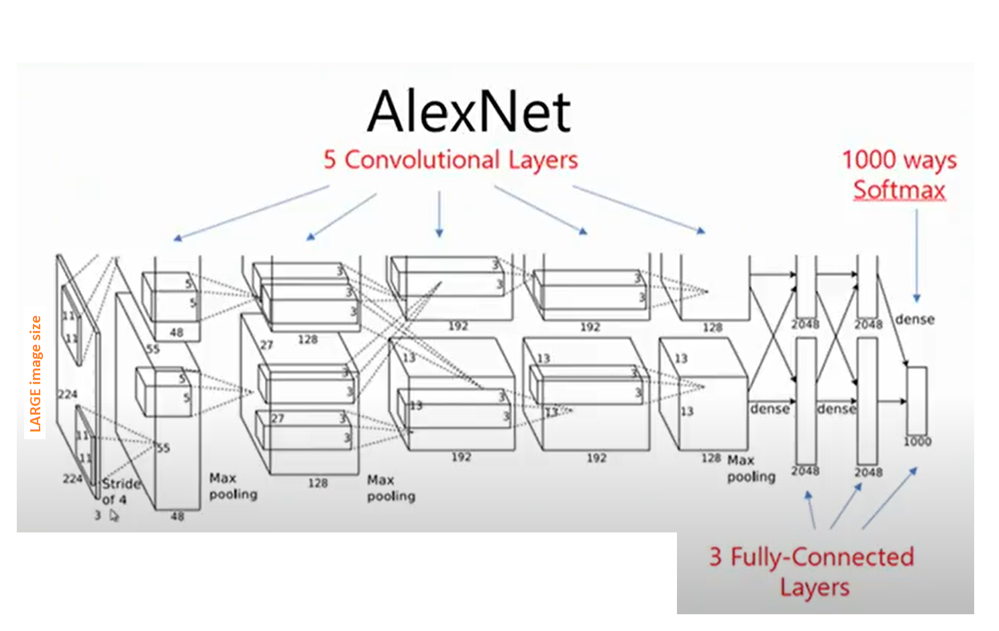

## Import

In [4]:
%matplotlib inline
import tqdm
import copy
import time
import torch
import numpy as np
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torchvision
from torchvision import transforms,datasets, models

print(torch.__version__) # This code has been updated for PyTorch 1.0.0

1.5.0


## Load Data:

In [13]:
apply_transform = transforms.Compose([transforms.Resize(224),transforms.ToTensor()])
##224 since, Alex net takes in 224 x 224
BatchSize = 2

trainset = datasets.CIFAR10(root='./CIFAR10', train=True, download=True, transform=apply_transform)
trainLoader = torch.utils.data.DataLoader(trainset, batch_size=BatchSize,
                                          shuffle=True, num_workers=4) # Creating dataloader

testset = datasets.CIFAR10(root='./CIFAR10', train=False, download=True, transform=apply_transform)
testLoader = torch.utils.data.DataLoader(testset, batch_size=BatchSize,
                                         shuffle=False, num_workers=4) # Creating dataloader

Files already downloaded and verified
Files already downloaded and verified


In [14]:
# Size of train and test datasets
print('No. of samples in train set: '+str(len(trainLoader.dataset)))
print('No. of samples in test set: '+str(len(testLoader.dataset)))

No. of samples in train set: 50000
No. of samples in test set: 10000


## Define network architecture + Modification

In [15]:
net = models.AlexNet()
print(net)

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

<b> We only have 10 classes in the data </b>

In [21]:
new_calssifier = nn.Sequential(*list(net.classifier.children())[:-1])
net = nn.Sequential(*list(net.children())[:-1])
net.add_module('Classifier' , new_calssifier)
net.add_module('Linear' , nn.Linear(4096,10))
print(net)

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (1): AdaptiveAvgPool2d(output_size=(6, 6))
  (Classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
    (2): Re

In [22]:
# Counting number of trainable parameters
totalParams = 0
for name,params in net.named_parameters():
    print(name,'-->',params.size())
    totalParams += np.sum(np.prod(params.size()))
print('Total number of parameters: '+str(totalParams))

0.0.weight --> torch.Size([64, 3, 11, 11])
0.0.bias --> torch.Size([64])
0.3.weight --> torch.Size([192, 64, 5, 5])
0.3.bias --> torch.Size([192])
0.6.weight --> torch.Size([384, 192, 3, 3])
0.6.bias --> torch.Size([384])
0.8.weight --> torch.Size([256, 384, 3, 3])
0.8.bias --> torch.Size([256])
0.10.weight --> torch.Size([256, 256, 3, 3])
0.10.bias --> torch.Size([256])
Classifier.1.weight --> torch.Size([4096, 9216])
Classifier.1.bias --> torch.Size([4096])
Classifier.4.weight --> torch.Size([4096, 4096])
Classifier.4.bias --> torch.Size([4096])
Linear.weight --> torch.Size([10, 4096])
Linear.bias --> torch.Size([10])
Total number of parameters: 57044810


In [17]:
# Copying initial weights for visualization
init_weightConv1 = copy.deepcopy(net.features[0].weight.data) # 1st conv layer
init_weightConv2 = copy.deepcopy(net.features[3].weight.data) # 2nd conv layer

In [19]:
# Check availability of GPU
use_gpu = torch.cuda.is_available()
if use_gpu:
    print('GPU is available!')
    device = "cuda"
else:
    print('GPU is not available!')
    device = "cpu"

net = net.to(device)

GPU is available!


RuntimeError: CUDA out of memory. Tried to allocate 20.00 MiB (GPU 0; 2.00 GiB total capacity; 242.93 MiB already allocated; 0 bytes free; 246.00 MiB reserved in total by PyTorch)

## Define loss function and optimizer

In [11]:
criterion = nn.NLLLoss() # Negative Log-likelihood
optimizer = optim.Adam(net.parameters(), lr=1e-4) # Adam

## Train the network

In [20]:
iterations = 2
trainLoss = []
testAcc = []
start = time.time()
for epoch in range(iterations):
    epochStart = time.time()
    runningLoss = 0    
    net.train() # For training
    for data in tqdm.tqdm_notebook(trainLoader):
        inputs,labels = data
        inputs, labels = inputs.to(device), labels.to(device)  
       
        # Initialize gradients to zero
        optimizer.zero_grad()
        # Feed-forward input data through the network        
        outputs = net(inputs)        
        # Compute loss/error
        loss = criterion(F.log_softmax(outputs,dim=1), labels)
        # Backpropagate loss and compute gradients
        loss.backward()
        # Update the network parameters
        optimizer.step()
        # Accumulate loss per batch
        runningLoss += loss.item()  
    avgTrainLoss = runningLoss/(len(trainset)/BatchSize)
    trainLoss.append(avgTrainLoss)
    
    # Evaluating performance on test set for each epoch
    net.eval() # For testing [Affects batch-norm and dropout layers (if any)]
    running_correct = 0
    with torch.no_grad():
        for data in testLoader:
            inputs,labels = data
            inputs = inputs.to(device)
            outputs = net(inputs)
            _, predicted = torch.max(outputs.data, 1)
            if use_gpu:                
                predicted = predicted.cpu()            
            running_correct += (predicted == labels).sum()
    avgTestAcc = float(running_correct)*100/10000.0
    testAcc.append(avgTestAcc)
        
    # Plotting training loss vs Epochs
    fig1 = plt.figure(1)        
    plt.plot(range(epoch+1),trainLoss,'r-',label='train')        
    if epoch==0:
        plt.legend(loc='upper left')
        plt.xlabel('Epochs')
        plt.ylabel('Training loss')   
    # Plotting testing accuracy vs Epochs
    fig2 = plt.figure(2)        
    plt.plot(range(epoch+1),testAcc,'g-',label='test')        
    if epoch==0:
        plt.legend(loc='upper left')
        plt.xlabel('Epochs')
        plt.ylabel('Testing accuracy')    
    epochEnd = time.time()-epochStart
    print('Iteration: {:.0f} /{:.0f}  ;  Training Loss: {:.6f} ; Testing Acc: {:.3f} ; Time consumed: {:.0f}m {:.0f}s '\
          .format(epoch + 1,iterations,avgTrainLoss,avgTestAcc,epochEnd//60,epochEnd%60))
end = time.time()-start
print('Training completed in {:.0f}m {:.0f}s'.format(end//60,end%60))

C:\Users\Ashwin\Miniconda3\lib\site-packages\ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


RuntimeError: cuDNN error: CUDNN_STATUS_ALLOC_FAILED

In [ ]:
# Copying trained weights for visualization
trained_weightConv1 = copy.deepcopy(net.features[0].weight.data)
trained_weightConv2 = copy.deepcopy(net.features[3].weight.data)
if use_gpu:
    trained_weightConv1 = trained_weightConv1.cpu()
    trained_weightConv2 = trained_weightConv2.cpu()

## Visualization of weights

In [ ]:
# functions to show an image
def imshow(img, strlabel):
    npimg = img.numpy()
    npimg = np.abs(npimg)
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 10
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size
    plt.figure()
    plt.title(strlabel)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

In [ ]:
imshow(torchvision.utils.make_grid(init_weightConv1,nrow=8,normalize=True),'Initial weights: conv1')
imshow(torchvision.utils.make_grid(trained_weightConv1,nrow=8,normalize=True),'Trained weights: conv1')
imshow(torchvision.utils.make_grid(init_weightConv1-trained_weightConv1,nrow=8,normalize=True),'Difference of weights: conv1')

In [ ]:
imshow(torchvision.utils.make_grid(init_weightConv2[0].unsqueeze(1),nrow=8,normalize=True),'Initial weights: conv2')
imshow(torchvision.utils.make_grid(trained_weightConv2[0].unsqueeze(1),nrow=8,normalize=True),'Trained weights: conv2')
imshow(torchvision.utils.make_grid(init_weightConv2[0].unsqueeze(1)-trained_weightConv2[0].unsqueeze(1),nrow=8,normalize=True),'Difference of weights: conv2')

# VGG Net

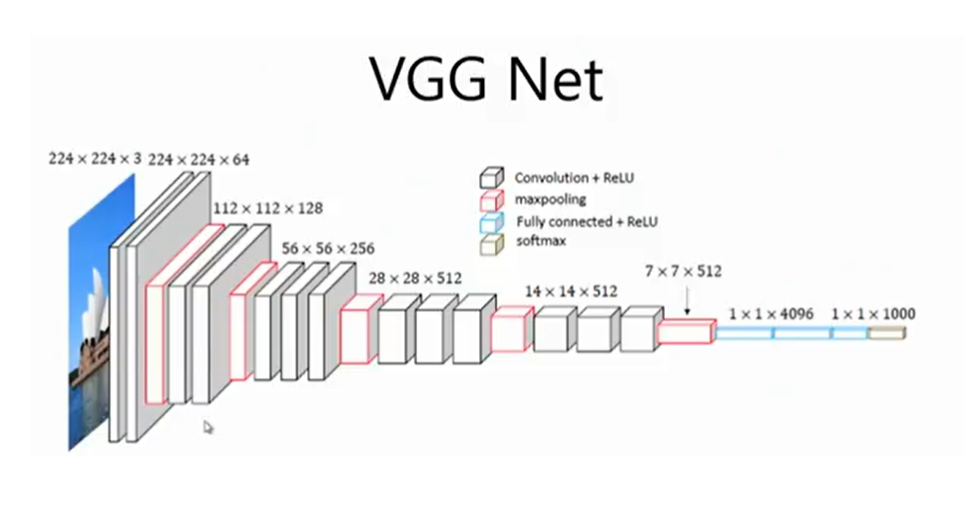

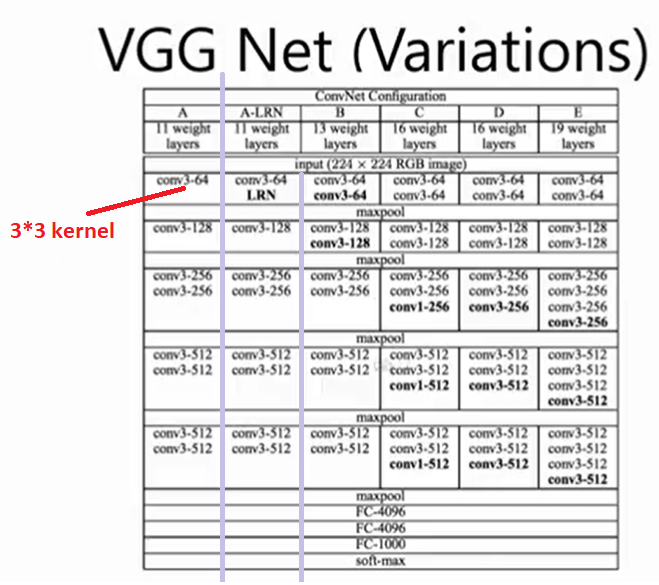

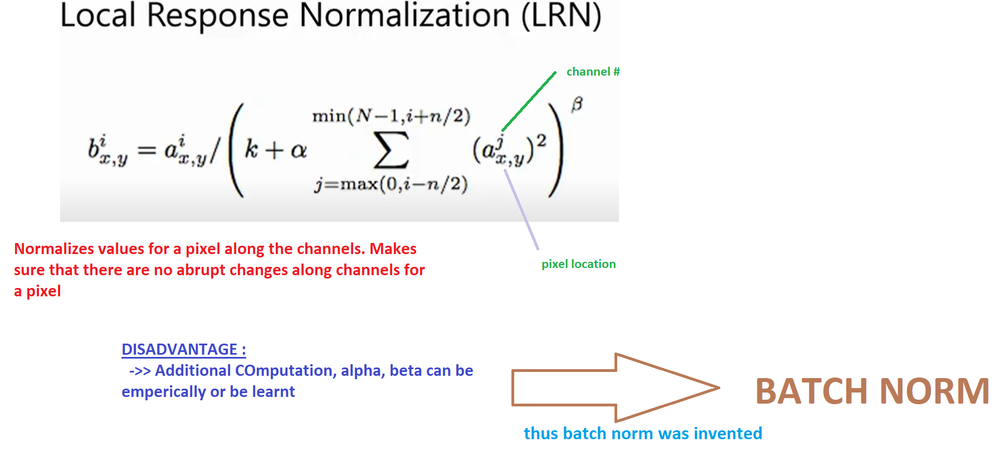

## Import

In [23]:
%matplotlib inline
import tqdm
import copy
import time
import torch
import numpy as np
import torchvision
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision import transforms,datasets, models

print(torch.__version__) # This code has been updated for PyTorch 1.0.0

1.5.0


## Load Data:

In [24]:
apply_transform = transforms.Compose([transforms.Resize(224),transforms.ToTensor()])
BatchSize = 4

trainset = datasets.CIFAR10(root='./CIFAR10', train=True, download=True, transform=apply_transform)
trainLoader = torch.utils.data.DataLoader(trainset, batch_size=BatchSize,
                                          shuffle=True, num_workers=4) # Creating dataloader

testset = datasets.CIFAR10(root='./CIFAR10', train=False, download=True, transform=apply_transform)
testLoader = torch.utils.data.DataLoader(testset, batch_size=BatchSize,
                                         shuffle=False, num_workers=4) # Creating dataloader

Files already downloaded and verified
Files already downloaded and verified


In [25]:
# Size of train and test datasets
print('No. of samples in train set: '+str(len(trainLoader.dataset)))
print('No. of samples in test set: '+str(len(testLoader.dataset)))

No. of samples in train set: 50000
No. of samples in test set: 10000


## Define network architecture

In [26]:
net = models.vgg16()
print(net)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

<b> We only have 10 classes in the data </b>

In [31]:
new_calssifier = nn.Sequential(*list(net.classifier.children())[:-1])
net = nn.Sequential(*list(net.children())[:-1])
net.add_module('Classifier' , new_calssifier)
net.add_module('Linear' , nn.Linear(4096,10))
print(net)

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [27]:
# Counting number of trainable parameters
totalParams = 0
for name,params in net.named_parameters():
    print(name,'-->',params.size())
    totalParams += np.sum(np.prod(params.size()))
print('Total number of parameters: '+str(totalParams))

features.0.weight --> torch.Size([64, 3, 3, 3])
features.0.bias --> torch.Size([64])
features.2.weight --> torch.Size([64, 64, 3, 3])
features.2.bias --> torch.Size([64])
features.5.weight --> torch.Size([128, 64, 3, 3])
features.5.bias --> torch.Size([128])
features.7.weight --> torch.Size([128, 128, 3, 3])
features.7.bias --> torch.Size([128])
features.10.weight --> torch.Size([256, 128, 3, 3])
features.10.bias --> torch.Size([256])
features.12.weight --> torch.Size([256, 256, 3, 3])
features.12.bias --> torch.Size([256])
features.14.weight --> torch.Size([256, 256, 3, 3])
features.14.bias --> torch.Size([256])
features.17.weight --> torch.Size([512, 256, 3, 3])
features.17.bias --> torch.Size([512])
features.19.weight --> torch.Size([512, 512, 3, 3])
features.19.bias --> torch.Size([512])
features.21.weight --> torch.Size([512, 512, 3, 3])
features.21.bias --> torch.Size([512])
features.24.weight --> torch.Size([512, 512, 3, 3])
features.24.bias --> torch.Size([512])
features.26.wei

In [28]:
# Copying initial weights for visualization
init_weightConv1 = copy.deepcopy(net.features[0].weight.data) # 1st conv layer
init_weightConv2 = copy.deepcopy(net.features[2].weight.data) # 2nd conv layer

In [29]:
# Check availability of GPU
use_gpu = torch.cuda.is_available()
# use_gpu = False # Uncomment in case of GPU memory error
if use_gpu:
    print('GPU is available!')
    device = "cuda"
else:
    print('GPU is not available!')
    device = "cpu"
    
net = net.to(device)

GPU is available!


RuntimeError: CUDA out of memory. Tried to allocate 20.00 MiB (GPU 0; 2.00 GiB total capacity; 244.04 MiB already allocated; 0 bytes free; 246.00 MiB reserved in total by PyTorch)

## Define loss function and optimizer

In [30]:
criterion = nn.NLLLoss() # Negative Log-likelihood
optimizer = optim.Adam(net.parameters(), lr=1e-4) # Adam

## Train the network

In [ ]:
iterations = 5
trainLoss = []
testAcc = []
start = time.time()
for epoch in range(iterations):
    epochStart = time.time()
    runningLoss = 0    
    net.train() # For training
    for data in tqdm.tqdm_notebook(trainLoader):
        inputs,labels = data
        inputs, labels = inputs.to(device), labels.to(device) 
       
        # Initialize gradients to zero
        optimizer.zero_grad()
        # Feed-forward input data through the network        
        outputs = net(inputs)        
        # Compute loss/error
        loss = criterion(F.log_softmax(outputs,dim=1), labels)
        # Backpropagate loss and compute gradients
        loss.backward()
        # Update the network parameters
        optimizer.step()
        # Accumulate loss per batch
        runningLoss += loss.item()  
        
    avgTrainLoss = runningLoss/(50000.0/BatchSize)
    trainLoss.append(avgTrainLoss)
    
    # Evaluating performance on test set for each epoch
    net.eval() # For testing [Affects batch-norm and dropout layers (if any)]
    running_correct = 0
    with torch.no_grad():
        for data in tqdm.tqdm_notebook(testLoader):
            inputs,labels = data
            inputs = inputs.to(device)
            outputs = net(inputs)
            _, predicted = torch.max(outputs.data, 1)
            if use_gpu:                
                predicted = predicted.cpu()            
            running_correct += (predicted == labels).sum()
            
    avgTestAcc = float(running_correct)*100/10000.0
    testAcc.append(avgTestAcc)
        
    # Plotting training loss vs Epochs
    fig1 = plt.figure(1)        
    plt.plot(range(epoch+1),trainLoss,'r-',label='train')        
    if epoch==0:
        plt.legend(loc='upper left')
        plt.xlabel('Epochs')
        plt.ylabel('Training loss')   
    # Plotting testing accuracy vs Epochs
    fig2 = plt.figure(2)        
    plt.plot(range(epoch+1),testAcc,'g-',label='test')        
    if epoch==0:
        plt.legend(loc='upper left')
        plt.xlabel('Epochs')
        plt.ylabel('Testing accuracy')    
    epochEnd = time.time()-epochStart
    print('Iteration: {:.0f} /{:.0f}  ;  Training Loss: {:.6f} ; Testing Acc: {:.3f} ; Time consumed: {:.0f}m {:.0f}s '\
          .format(epoch + 1,iterations,avgTrainLoss,avgTestAcc,epochEnd//60,epochEnd%60))
end = time.time()-start
print('Training completed in {:.0f}m {:.0f}s'.format(end//60,end%60))


In [ ]:
# Copying trained weights for visualization
trained_weightConv1 = copy.deepcopy(net.features[0].weight.data)
trained_weightConv2 = copy.deepcopy(net.features[2].weight.data)
if use_gpu:
    trained_weightConv1 = trained_weightConv1.cpu()
    trained_weightConv2 = trained_weightConv2.cpu()

## Visualization of weights

In [ ]:
# functions to show an image
def imshow(img, strlabel):
    npimg = img.numpy()
    npimg = np.abs(npimg)
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 10
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size
    plt.figure()
    plt.title(strlabel)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

In [ ]:
imshow(torchvision.utils.make_grid(init_weightConv1,nrow=8,normalize=True),'Initial weights: conv1')
imshow(torchvision.utils.make_grid(trained_weightConv1,nrow=8,normalize=True),'Trained weights: conv1')
imshow(torchvision.utils.make_grid(init_weightConv1-trained_weightConv1,nrow=8,normalize=True),'Difference of weights: conv1')

In [ ]:
imshow(torchvision.utils.make_grid(init_weightConv2[0].unsqueeze(1),nrow=8,normalize=True),'Initial weights: conv2')
imshow(torchvision.utils.make_grid(trained_weightConv2[0].unsqueeze(1),nrow=8,normalize=True),'Trained weights: conv2')
imshow(torchvision.utils.make_grid(init_weightConv2[0].unsqueeze(1)-trained_weightConv2[0].unsqueeze(1),nrow=8,normalize=True),'Difference of weights: conv2')

# GoogLeNet (Inception V3)

## Theory

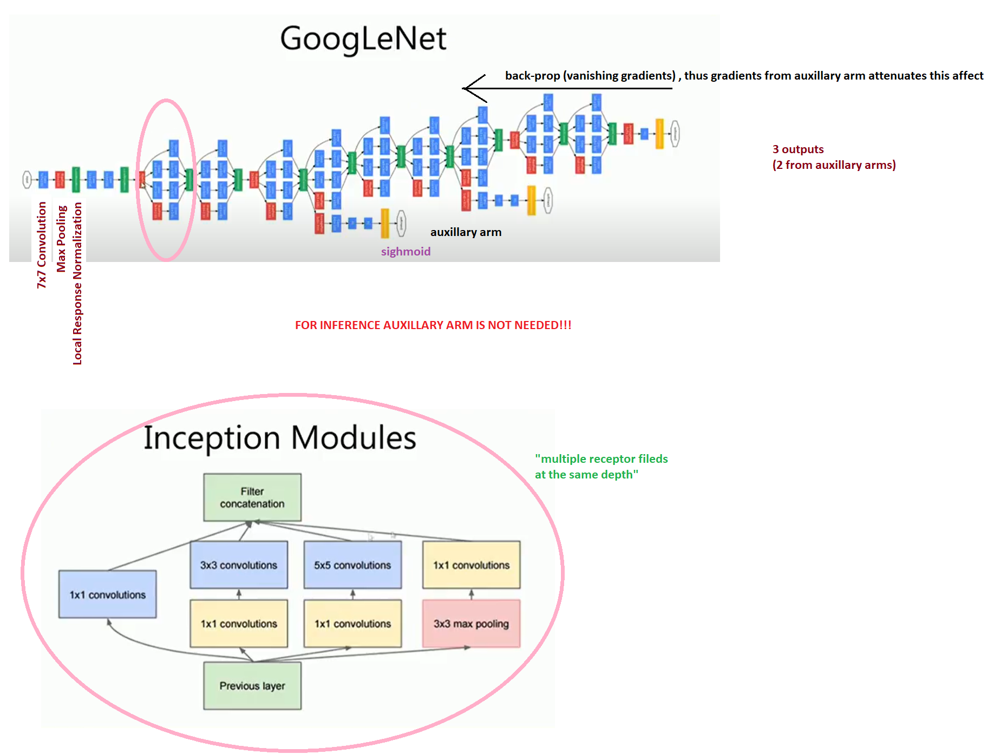

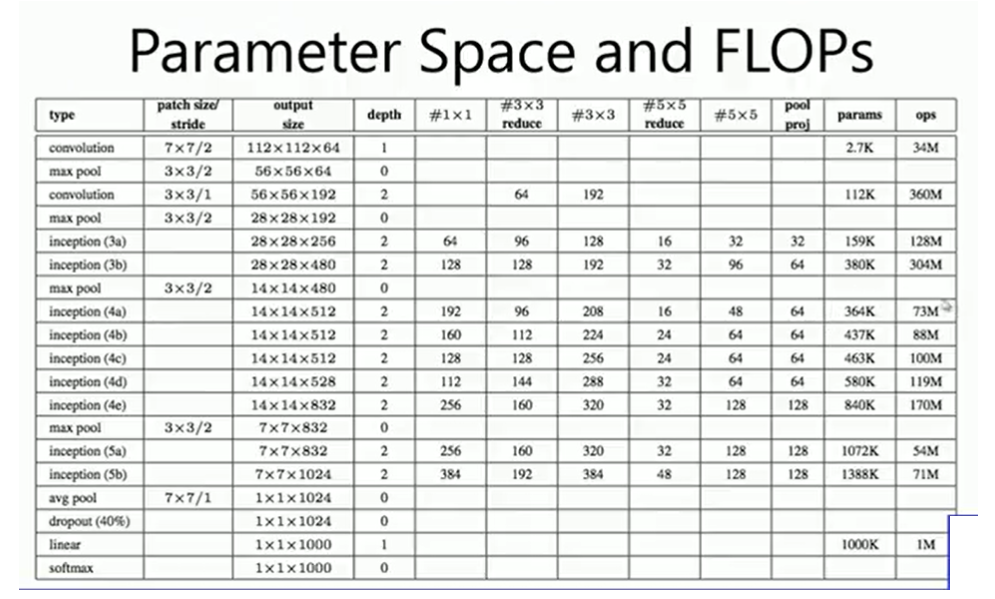

## Import

In [57]:
%matplotlib inline
import tqdm
import copy
import time
import torch
import numpy as np
import torchvision
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchvision import transforms,datasets, models

print(torch.__version__) # This code has been updated for PyTorch 1.0.0

1.5.0


## Load Data:

In [58]:
# inception_v3 in pytorch requries input to be of size(3x299x299)
apply_transform = transforms.Compose([transforms.Resize(299),transforms.ToTensor()])
BatchSize = 2 # batch size > 1

trainset = datasets.CIFAR10(root='./CIFAR10', train=True, download=True, transform=apply_transform)
trainLoader = torch.utils.data.DataLoader(trainset, batch_size=BatchSize,
                                          shuffle=True, num_workers=4) # Creating dataloader

testset = datasets.CIFAR10(root='./CIFAR10', train=False, download=True, transform=apply_transform)
testLoader = torch.utils.data.DataLoader(testset, batch_size=BatchSize,
                                         shuffle=False, num_workers=4) # Creating dataloader

Files already downloaded and verified
Files already downloaded and verified


In [59]:
# Size of train and test datasets
print('No. of samples in train set: '+str(len(trainLoader.dataset)))
print('No. of samples in test set: '+str(len(testLoader.dataset)))

No. of samples in train set: 50000
No. of samples in test set: 10000


## Define network architecture
Inceptionv3 [architecture](https://hackathonprojects.files.wordpress.com/2016/09/v3.png)

In [60]:
net = models.inception_v3()
print(net)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, t

In [61]:
# Counting number of trainable parameters
totalParams = 0
for name,params in net.named_parameters():
    print(name,'-->',params.size())
    totalParams += np.sum(np.prod(params.size()))
print('Total number of parameters: '+str(totalParams))

Conv2d_1a_3x3.conv.weight --> torch.Size([32, 3, 3, 3])
Conv2d_1a_3x3.bn.weight --> torch.Size([32])
Conv2d_1a_3x3.bn.bias --> torch.Size([32])
Conv2d_2a_3x3.conv.weight --> torch.Size([32, 32, 3, 3])
Conv2d_2a_3x3.bn.weight --> torch.Size([32])
Conv2d_2a_3x3.bn.bias --> torch.Size([32])
Conv2d_2b_3x3.conv.weight --> torch.Size([64, 32, 3, 3])
Conv2d_2b_3x3.bn.weight --> torch.Size([64])
Conv2d_2b_3x3.bn.bias --> torch.Size([64])
Conv2d_3b_1x1.conv.weight --> torch.Size([80, 64, 1, 1])
Conv2d_3b_1x1.bn.weight --> torch.Size([80])
Conv2d_3b_1x1.bn.bias --> torch.Size([80])
Conv2d_4a_3x3.conv.weight --> torch.Size([192, 80, 3, 3])
Conv2d_4a_3x3.bn.weight --> torch.Size([192])
Conv2d_4a_3x3.bn.bias --> torch.Size([192])
Mixed_5b.branch1x1.conv.weight --> torch.Size([64, 192, 1, 1])
Mixed_5b.branch1x1.bn.weight --> torch.Size([64])
Mixed_5b.branch1x1.bn.bias --> torch.Size([64])
Mixed_5b.branch5x5_1.conv.weight --> torch.Size([48, 192, 1, 1])
Mixed_5b.branch5x5_1.bn.weight --> torch.Size([

In [ ]:
# Modifying the last fully-connected layers(including aux network) for 10 classes
net.AuxLogits.fc = nn.Linear(768,10)  #auxillary arm
net.fc = nn.Linear(2048,10)  #final output

In [ ]:
# Copying initial weights for visualization
init_weightConv1 = copy.deepcopy(net.Conv2d_1a_3x3.conv.weight.data) # 1st conv layer
init_weightConv2 = copy.deepcopy(net.Conv2d_2a_3x3.conv.weight.data) # 2nd conv layer

In [ ]:
# Check availability of GPU

use_gpu = torch.cuda.is_available()
# use_gpu = False # Uncomment in case of GPU memory error
if use_gpu:
    print('GPU is available!')
    device = "cuda"
else:
    print('GPU is not available!')
    device = "cpu"
    
net = net.to(device)

## Define loss function and optimizer

In [ ]:
criterion = nn.NLLLoss() # Negative Log-likelihood
optimizer = optim.Adam(net.parameters(), lr=1e-4) # Adam

## Train the network

In [ ]:
iterations = 10
trainLoss = [] # List for saving main loss per epoch
trainAuxLoss = [] # List for saving auxillary loss per epoch
trainTotalLoss = [] # List for saving total loss per epoch
trainAcc = [] # List for saving training accuracy per epoch

testLoss = [] # List for saving testing loss per epoc
testAcc = [] # List for saving testing accuracy per epoch

start = time.time()
for epoch in range(iterations):
    epochStart = time.time()
    runningLoss = 0.0
    runningAuxLoss = 0.0 
    runningTotalLoss = 0.0
    avgAuxLoss = 0.0
    avgTotalLoss = 0.0
    running_correct = 0
    net.train() # For training
    for data in tqdm.tqdm_notebook(trainLoader):
        # Initialize gradients to zero
        optimizer.zero_grad()        
        inputs,labels = data
        inputs, labels = inputs.to(device), labels.to(device)
        # Feed-forward input data through the network        
        outputs,aux_outputs = net(inputs)  
        _, predicted = torch.max(outputs.data, 1)                        
        running_correct += (predicted == labels.data).sum()             
              
        # Compute loss/error
        loss = criterion(F.log_softmax(outputs,dim=1), labels)
        aux_loss = criterion(F.log_softmax(aux_outputs,dim=1), labels)
        total_loss = loss+aux_loss
        # Backpropagate loss and compute gradients
        total_loss.backward()
        # Update the network parameters
        optimizer.step()
        # Accumulate loss per batch
        runningLoss += loss.item()    
        runningAuxLoss += aux_loss.item()    
        runningTotalLoss += total_loss.item() 
        
    avgTrainAcc = float(running_correct)*100/50000.0
    avgTrainLoss = runningLoss/(50000.0/BatchSize)
    avgAuxLoss = runningAuxLoss/(50000.0/BatchSize)
    avgTotalLoss = runningTotalLoss/(50000.0/BatchSize)
    trainAcc.append(avgTrainAcc)
    trainLoss.append(avgTrainLoss)
    trainAuxLoss.append(avgAuxLoss)
    trainTotalLoss.append(avgTotalLoss)
    
    # Evaluating performance on test set for each epoch
    net.eval() # For testing [Affects batch-norm and dropout layers (if any)]
    running_correct = 0
    with torch.no_grad():
        for data in testLoader:
            inputs,labels = data
            inputs, labels= inputs.to(device), labels.to(device)
            outputs = net(inputs)
            _, predicted = torch.max(outputs.data, 1)             
            running_correct += (predicted == labels.data).sum()

            loss = criterion(F.log_softmax(outputs,dim=1), labels)
            runningLoss += loss.item() 
        
    avgTestLoss = runningLoss/(10000.0/BatchSize)
    avgTestAcc = float(running_correct)*100/10000.0
    testLoss.append(avgTestLoss)
    testAcc.append(avgTestAcc)
        
    # Plotting training loss vs aux_loss
    fig1 = plt.figure(1)        
    plt.plot(range(epoch+1),trainLoss,'r-',label='main loss')  
    plt.plot(range(epoch+1),trainAuxLoss,'g-',label='aux') 
    if epoch==0:
        plt.legend(loc='upper left')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')   
    
    # Plotting training loss vs Epochs
    fig2 = plt.figure(2)        
    plt.plot(range(epoch+1),trainTotalLoss,'r-',label='train')  
    plt.plot(range(epoch+1),testLoss,'g-',label='test') 
    if epoch==0:
        plt.legend(loc='upper left')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')   
    # Plotting testing accuracy vs Epochs
    fig3 = plt.figure(3)        
    plt.plot(range(epoch+1),trainAcc,'r-',label='train')    
    plt.plot(range(epoch+1),testAcc,'g-',label='test')        
    if epoch==0:
        plt.legend(loc='upper left')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')    
    epochEnd = time.time()-epochStart
    print('Iteration: {:.0f} /{:.0f}  ;  Training Loss: {:.6f} ; Testing Acc: {:.3f} ; Time consumed: {:.0f}m {:.0f}s '\
          .format(epoch + 1,iterations,avgTrainLoss,avgTestAcc,epochEnd//60,epochEnd%60))
end = time.time()-start
print('Training completed in {:.0f}m {:.0f}s'.format(end//60,end%60))


In [ ]:
# Copying trained weights for visualization
trained_weightConv1 = copy.deepcopy(net.Conv2d_1a_3x3.conv.weight.data.cpu())
trained_weightConv2 = copy.deepcopy(net.Conv2d_2a_3x3.conv.weight.data.cpu())
if use_gpu:
    trained_weightConv1 = trained_weightConv1.cpu()
    trained_weightConv2 = trained_weightConv2.cpu()

## Visualization of weights

In [ ]:
# functions to show an image
def imshow(img, strlabel):
    npimg = img.numpy()
    npimg = np.abs(npimg)
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 10
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size
    plt.figure()
    plt.title(strlabel)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

In [ ]:
# Visualizing weights of 1st convolutional layer
imshow(torchvision.utils.make_grid(init_weightConv1,nrow=8,normalize=True),'Initial weights: conv1')
imshow(torchvision.utils.make_grid(trained_weightConv1,nrow=8,normalize=True),'Trained weights: conv1')
imshow(torchvision.utils.make_grid(init_weightConv1-trained_weightConv1,nrow=8,normalize=True),'Difference of weights: conv1')

In [ ]:
# Visualizing weights of 2nd convolutional layer
imshow(torchvision.utils.make_grid(init_weightConv2[0].unsqueeze(1),nrow=8,normalize=True),'Initial weights: conv2')
imshow(torchvision.utils.make_grid(trained_weightConv2[0].unsqueeze(1),nrow=8,normalize=True),'Trained weights: conv2')
imshow(torchvision.utils.make_grid(init_weightConv2[0].unsqueeze(1)-trained_weightConv2[0].unsqueeze(1),nrow=8,normalize=True),'Difference of weights: conv2')